In [1]:
import sys
# !{sys.executable} -m pip install pandas
# !{sys.executable} -m pip install scikit-learn

In [2]:
import math
import numpy as np
import pandas as pd
import os
import json
import matplotlib as mpl
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import sklearn as sk
#from matplotlib import rcParams
from IPython.display import Image, display, HTML
from mpl_toolkits.mplot3d import Axes3D
# mpl.use('TkAgg')
%matplotlib inline
workspace = '/home/jovyan/workspace'
inputPath = '.'
outputPath = '.'

In [3]:
modelNames = [filename for filename in os.listdir(inputPath) if filename[:6] == 'pemod_']

In [4]:
inputList = []
dataList = []
for name in modelNames:
#     with (name / 'inputs.txt').open() as json_file:
    with open(os.path.join(name, 'params.json')) as json_file:
        inputList.append(json.load(json_file))
    data = pd.read_csv(os.path.join(name, 'standard.csv'))
    goodheader = ''.join(list(data.columns.values))[2:].split(' ')
    data.columns = goodheader
    dataList.append(data)
outputFrame = pd.concat(dataList, keys = modelNames)
inputFrame = pd.DataFrame(inputList, index = modelNames)

In [5]:
localFrame = pd.DataFrame()

In [6]:
outputFrame.columns

Index(['modeltime', 'step', 'temperatureField_angGrad_innerInt',
       'temperatureField_angGrad_outerInt',
       'temperatureField_angGrad_volumeInt', 'temperatureField_innerInt',
       'temperatureField_outerInt', 'temperatureField_radGrad_innerInt',
       'temperatureField_radGrad_outerInt',
       'temperatureField_radGrad_volumeInt', 'temperatureField_volumeInt',
       'velocityField_angComp_angGrad_innerInt',
       'velocityField_angComp_angGrad_outerInt',
       'velocityField_angComp_angGrad_volumeInt',
       'velocityField_angComp_innerInt', 'velocityField_angComp_outerInt',
       'velocityField_angComp_radGrad_innerInt',
       'velocityField_angComp_radGrad_outerInt',
       'velocityField_angComp_radGrad_volumeInt',
       'velocityField_angComp_volumeInt', 'velocityField_angGrad_innerInt',
       'velocityField_angGrad_outerInt', 'velocityField_angGrad_volumeInt',
       'velocityField_innerInt', 'velocityField_outerInt',
       'velocityField_radComp_angGrad_inner

In [7]:
localFrame['Nu'] = outputFrame.temperatureField_radGrad_outerInt / outputFrame.temperatureField_innerInt
localFrame['avTemp'] = outputFrame.temperatureField_volumeInt
localFrame['VRMS'] = outputFrame.velocityField_volumeInt
localFrame['surfVRMS'] = outputFrame.velocityField_outerInt
localFrame['modeltime'] = outputFrame.modeltime
localFrame['step'] = outputFrame.step

In [8]:
# inputFrame = inputFrame[inputFrame['f'] >= 0.2]
# inputFrame = inputFrame[inputFrame['f'] <= 0.8]

In [24]:
mpl.rcParams.update({
    'text.color': "white",
    'axes.labelcolor': "white"
    })

<Figure size 7200x4800 with 0 Axes>

<Figure size 7200x4800 with 0 Axes>

In [165]:
res = 32
timebounds = [0., 0.3]

rowName = 'Ra'
rows = sorted(set(inputFrame.Ra))
cols = ['Nu', 'VRMS', 'avTemp']
cmap = plt.get_cmap('gnuplot')

plt.figure(dpi = 1200)
fig, axs = plt.subplots(len(rows), len(cols), sharex=True, figsize = (12, 12), dpi = 1000)

for index, val in enumerate(cols):
    axs[0][index].set_title(val)
for index, val in enumerate(rows):
    val = round(math.log(val, 10), 2)
    axs[index][0].set_ylabel(val)
for colno, colval in enumerate(cols):
    for rowno, rowval in enumerate(rows):
        ax = axs[rowno, colno]
        ax.set_facecolor('black')
        ax.grid(color = 'grey', linestyle = '-', linewidth = 2)
        ax.tick_params(color = 'white', labelcolor = 'white')
        for spine in ax.spines.values():
            spine.set_edgecolor('white')

timeFrame = localFrame.loc[
    localFrame['modeltime'] > timebounds[0]
    ].loc[
        localFrame['modeltime'] < timebounds[1]
        ]

fvals = sorted(set(inputFrame.f))[::-1]
for row, rowval in enumerate(rows):
    sub_inputFrame = inputFrame.loc[inputFrame[rowName] == rowval].loc[inputFrame['res'] == res]
    for fval in fvals:
        sub_sub_inputFrame = sub_inputFrame.loc[sub_inputFrame['f'] == fval]
        indices = sub_sub_inputFrame.index
        for index in indices:
            sub_localFrame = timeFrame.loc[index]
            for col, colval in enumerate(cols):
                if col in (0, 1):
                    linewidth = max(3., 6. / (math.log(rowval, 10)))
                    alpha = max(2. / 3., 2.99 / (math.log(rowval, 10)))
                else:
                    linewidth = 3.
                    alpha = 1.
                ignoreme = axs[row][col].plot(
                    sub_localFrame.modeltime,
                    sub_localFrame[colval],
                    color = cmap(fval),
                    linewidth = linewidth,
                    alpha = alpha
                    )
    subFrame = localFrame.loc[sub_inputFrame.index]
    subFrame = subFrame.loc[subFrame['modeltime'] > 0.025]
    for col, val in enumerate(cols):
        minval = subFrame[val].min() * 0.9
        maxval = subFrame[val].max() * 1.1
        axs[row][col].set_ylim([minval, maxval])
    # special clipping of velocity

axs[len(rows) - 1][int(len(cols) / 2)].set_xlabel('Dimensionless time')

legendtext = ['f = ' + str(round(val, 2)) for val in fvals]
legend = plt.figlegend(
    legendtext,
    facecolor = 'black',
    loc='lower center',
    shadow = True,
#     mode = 'expand',
    ncol=len(fvals)
    )
fig.subplots_adjust(hspace=0)
fig.set_facecolor('black')
# fig.suptitle('Isoviscous suite: resolution = ' + str(res))
fig.tight_layout()
fig.show()
# plt.savefig('isobench_full_hires_vert.png', dpi=1000)

<Figure size 7200x4800 with 0 Axes>

In [45]:
frame = inputFrame.loc[inputFrame['res'] == 32]
frame = frame.loc[inputFrame['Ra'] > 1e3]
frame = frame.loc[inputFrame['Ra'] < 1e7]
frame = frame.loc[inputFrame['f'] >= 0.2]
frame = frame.loc[inputFrame['f'] <= 0.8]
indices = frame.index
allwaDict = {}
for index in indices:
    waDict = {}
    frame = localFrame.loc[localFrame['modeltime'] > 0.2]
    frame = frame.loc[index]
    tIntervals = frame['modeltime'].diff()
    for item in frame.columns.values:
        if not item == 'modeltime':
            waDict[item + '_tAv'] = np.average(frame[item][1:], weights = tIntervals[1:])
    allwaDict[index] = waDict
reductionFrame = pd.DataFrame(allwaDict).transpose()

superFrame = pd.concat([inputFrame.loc[indices], reductionFrame], axis = 1, sort=False)[
    ['Ra', 'f', 'Nu_tAv', 'VRMS_tAv', 'avTemp_tAv', 'surfVRMS_tAv']
    ]

In [46]:
superFrame['logRa'] = np.log(superFrame.Ra)
superFrame['logNu'] = np.log(superFrame.Nu_tAv)
superFrame['logf'] = np.log(superFrame.f)
superFrame['logAvTemp'] = np.log(superFrame.avTemp_tAv)
superFrame['invf'] = 1. / superFrame.f
superFrame['f2'] = superFrame.f ** 2
superFrame['logf2'] = np.log(superFrame.f2)
superFrame['Sqrt_f'] = superFrame.f ** 0.5
superFrame['negSqRtf'] = superFrame.f ** -0.5
superFrame['Raf2'] = superFrame.f ** 2. * superFrame.Ra
superFrame['logRaf2'] = np.log(superFrame.Raf2)

In [47]:
superFrame

,Ra,f,Nu_tAv,VRMS_tAv,avTemp_tAv,surfVRMS_tAv,logRa,logNu,logf,logAvTemp,invf,f2,logf2,Sqrt_f,negSqRtf,Raf2,logRaf2
pemod_annunciated-atelene,3.162278e+04,0.5,5.216386,80.847514,0.410779,95.944196,10.361633,1.651805,-0.693147,-0.889701,2.000000,0.25,-1.386294,0.707107,1.414214,7.905694e+03,8.975339
pemod_arrendation-malreasoning,3.162278e+05,0.5,9.197833,336.732895,0.399490,415.941311,12.664218,2.218968,-0.693147,-0.917567,2.000000,0.25,-1.386294,0.707107,1.414214,7.905694e+04,11.277924
pemod_audibility-rajura,3.162278e+06,0.7,15.898428,1427.057618,0.447631,1713.957209,14.966803,2.766220,-0.356675,-0.803787,1.428571,0.49,-0.713350,0.836660,1.195229,1.549516e+06,14.253453
pemod_behindhand-synoecious,1.000000e+05,0.2,4.146946,133.671446,0.264802,182.555801,11.512925,1.422372,-1.609438,-1.328773,5.000000,0.04,-3.218876,0.447214,2.236068,4.000000e+03,8.294050
pemod_bunnymouth-hierophanticly,1.000000e+06,0.5,11.410208,665.090974,0.394399,828.930728,13.815511,2.434508,-0.693147,-0.930392,2.000000,0.25,-1.386294,0.707107,1.414214,2.500000e+05,12.429216
pemod_cabals-zoophoric,1.000000e+05,0.4,6.239824,159.801491,0.365737,200.667231,11.512925,1.830952,-0.916291,-1.005841,2.500000,0.16,-1.832581,0.632456,1.581139,1.600000e+04,9.680344
pemod_clarifies-rollaway,3.162278e+03,0.7,3.084918,17.451812,0.491391,18.279381,8.059048,1.126525,-0.356675,-0.710516,1.428571,0.49,-0.713350,0.836660,1.195229,1.549516e+03,7.345698
pemod_convenee-revaluated,3.162278e+05,0.8,11.650417,356.463837,0.486563,415.246453,12.664218,2.455342,-0.223144,-0.720388,1.250000,0.64,-0.446287,0.894427,1.118034,2.023858e+05,12.217931
pemod_diphenylhydantoin-borzois,1.000000e+04,0.8,4.740848,40.220060,0.507279,42.792971,9.210340,1.556216,-0.223144,-0.678694,1.250000,0.64,-0.446287,0.894427,1.118034,6.400000e+03,8.764053
pemod_disalliege-wanderer,3.162278e+03,0.4,2.367207,16.063251,0.394974,18.411738,8.059048,0.861711,-0.916291,-0.928934,2.500000,0.16,-1.832581,0.632456,1.581139,5.059644e+02,6.226466


Text(0, 0.5, 'Nu')

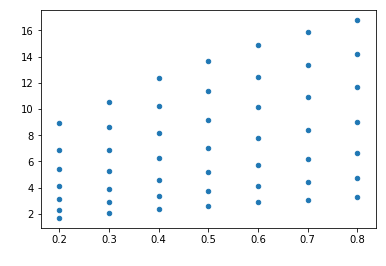

In [48]:
plot = superFrame.plot(
    kind = 'scatter',
    x = 'f',
    y = 'Nu_tAv',
#     c = 'Ra',
#     cmap = 'magma'
    )
plot.set_xlabel('f')
plot.set_ylabel('Nu')

In [70]:
from sklearn import linear_model
import numpy as np
def regress(dataFrame, xs, y, keytuple = None, rounding = 2, intercept = True):
    lmOut = []
    lm = linear_model.LinearRegression(fit_intercept = True)
    if type(xs) == str:
        xs = [xs,]
    if not keytuple is None:
        key, keyval = keytuple
        dataFrame = dataFrame.loc[dataFrame[key] == keyval]
    dataXs = list(zip(*[dataFrame[x] for x in xs]))
    dataY = dataFrame[y]
    lm.fit(dataXs, dataY)
    lmOut = [np.round(item, rounding) for item in (lm.coef_, lm.intercept_, lm.score(dataXs, dataY))]
    lmOut[0] = list(lmOut[0])
    header = y + " vs " + str(xs) + '; coef, intercept, score:'
    return header, lmOut
def regress_series(dataFrame, xs, y, key, rounding = 2, intercept = True):
    outList = []
    header = ''
    for keyval in sorted(set(dataFrame[key])):
        header, datarow = regress(
            dataFrame,
            xs,
            y,
            keytuple = (key, keyval),
            rounding = rounding,
            intercept = intercept
            )
        outList.append((round(keyval, rounding), datarow))
    header = key + "; " + header
    return header, outList

In [71]:
regress_series(superFrame, 'logRa', 'logNu', 'f')

("f; logNu vs ['logRa']; coef, intercept, score:",
 [(0.2, [[0.23851], -1.35427, 0.99824]),
  (0.3, [[0.238], -1.13147, 0.99249]),
  (0.4, [[0.24026], -0.99995, 0.99015]),
  (0.5, [[0.23975], -0.87866, 0.98745]),
  (0.6, [[0.23926], -0.78147, 0.98546]),
  (0.7, [[0.23841], -0.69796, 0.98362]),
  (0.8, [[0.23754], -0.6267, 0.98201])])

In [72]:
regress_series(superFrame, 'logf', 'logNu', 'Ra')

("Ra; logNu vs ['logf']; coef, intercept, score:",
 [(3162.27766, [[0.47288], 1.2948, 0.99994]),
  (10000.0, [[0.51601], 1.67814, 0.99971]),
  (31622.7766, [[0.54615], 2.02302, 0.99929]),
  (100000.0, [[0.55874], 2.3331, 0.99882]),
  (316227.76602, [[0.55444], 2.59338, 0.99847]),
  (1000000.0, [[0.5224], 2.78501, 0.99783]),
  (3162277.66017, [[0.46381], 2.93138, 0.99854])])

In [73]:
regress(superFrame, ['logRa', 'logf'], 'logNu')

("logNu vs ['logRa', 'logf']; coef, intercept, score:",
 [[0.24, 0.52], -0.52, 0.99])

In [75]:
regress(superFrame, 'logRaf2', 'logNu', rounding = 5)

("logNu vs ['logRaf2']; coef, intercept, score:",
 [[0.24164], -0.57614, 0.98927])

In [79]:
np

<module 'numpy' from '/home/jovyan/.local/lib/python3.5/site-packages/numpy/__init__.py'>

In [81]:
np.array(superFrame['logNu'])

array([1.6518048 , 2.21896794, 2.76622021, 1.42237224, 2.43450839,
       1.83095201, 1.12652513, 2.45534198, 1.55621606, 0.86171085,
       2.19516592, 1.52975327, 1.49316356, 2.18897338, 2.59358604,
       1.32526003, 1.82613487, 2.05266734, 1.68748996, 1.05689155,
       1.95497383, 2.61664617, 1.92975945, 0.9689624 , 1.41770903,
       2.13074094, 0.8435122 , 1.20920683, 2.51237412, 2.70137141,
       2.52157038, 0.53409473, 1.74826829, 1.13585222, 2.39175589,
       1.36744802, 2.81915729, 2.35765677, 2.32223552, 0.72320967,
       1.89063927, 1.18657448, 1.66425333, 1.05527819, 2.09674659,
       2.31520369, 2.15940479, 1.93124779, 2.65373291])

Text(0.5, 1.0, 'y = 0.241638x + -0.576144\nscore = 0.98927')

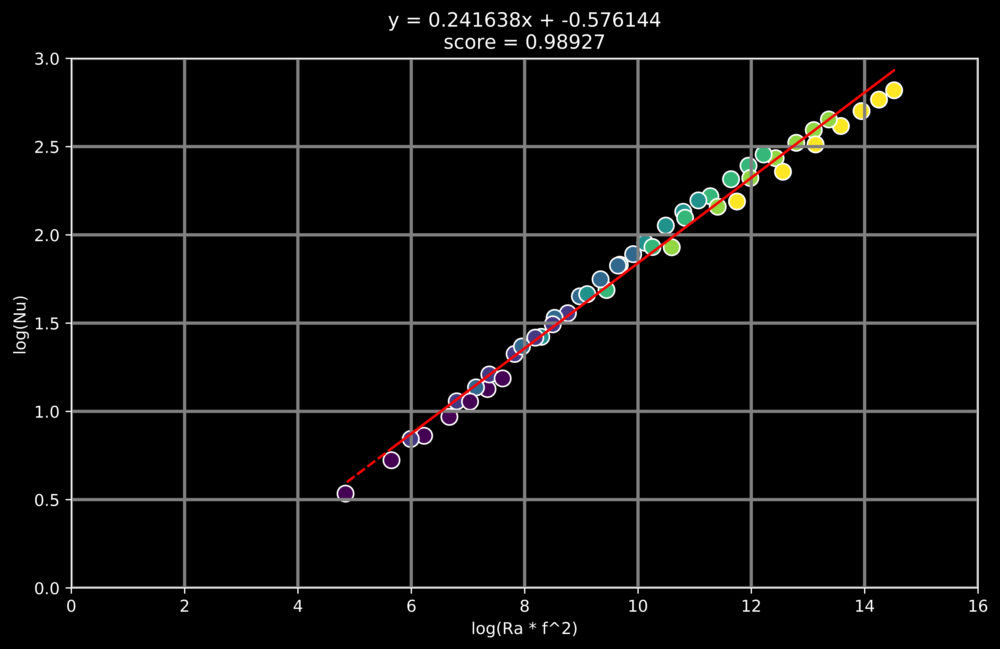

In [166]:
mpl.rcParams.update({
    'text.color': "white",
    'axes.labelcolor': "white"
    })

xs = np.array(superFrame['logRaf2'])
ys = np.array(superFrame['logNu'])
cs = np.log10(np.array(superFrame['Ra']))

fig = plt.figure(facecolor = 'black', edgecolor = 'black', figsize = (10, 6), dpi = 1000)
fig.add_axes()
ax = fig.add_subplot(111)
ax.grid(color = 'grey', linestyle = '-', linewidth = 2)
ax.scatter(xs, ys, c = cs, cmap = 'viridis', s = 100, edgecolor = 'white')
ax.tick_params(color = 'white', labelcolor = 'white')
for spine in ax.spines.values():
    spine.set_edgecolor('white')
ax.set_facecolor('black')
ax.set_xlabel('log(Ra * f^2)')
ax.set_ylabel('log(Nu)')
ax.set_xlim((0, 16))
ax.set_ylim((0, 3))
zs = np.polyfit(xs, ys, 1)
p = np.poly1d(zs)
plt.plot(xs,p(xs),"r--")
plt.title("y = %.6fx + %.6f\nscore = 0.98927"%(zs[0],zs[1])) 

In [ ]:
ax.

In [142]:
help(ax)

Help on AxesSubplot in module matplotlib.axes._subplots object:

class AxesSubplot(SubplotBase, matplotlib.axes._axes.Axes)
 |  Base class for subplots, which are :class:`Axes` instances with
 |  additional methods to facilitate generating and manipulating a set
 |  of :class:`Axes` within a figure.
 |  
 |  Method resolution order:
 |      AxesSubplot
 |      SubplotBase
 |      matplotlib.axes._axes.Axes
 |      matplotlib.axes._base._AxesBase
 |      matplotlib.artist.Artist
 |      builtins.object
 |  
 |  Methods inherited from SubplotBase:
 |  
 |  __init__(self, fig, *args, **kwargs)
 |      *fig* is a :class:`matplotlib.figure.Figure` instance.
 |      
 |      *args* is the tuple (*numRows*, *numCols*, *plotNum*), where
 |      the array of subplots in the figure has dimensions *numRows*,
 |      *numCols*, and where *plotNum* is the number of the subplot
 |      being created.  *plotNum* starts at 1 in the upper left
 |      corner and increases to the right.
 |      
 |     

In [37]:
inputFrame.loc[indices].f.values

array([0.5, 0.3, 0.5, 0.5, 0.7, 0.1, 1. , 0.2, 0.6, 1. , 1. , 0.5, 0.4,
       0.7, 0.1, 0.8, 0.9, 0.9, 0.1, 0.1, 0.8, 0.4, 0.9, 0.8, 0.4, 0.1,
       0.7, 0.2, 0.7, 1. , 0.9, 0.9, 0.5, 0.7, 0.6, 0.2, 0.3, 1. , 0.5,
       0.5, 0.2, 0.5, 0.6, 0.1, 0.7, 0.2, 0.4, 0.9, 0.4, 1. , 0.6, 0.6,
       0.2, 1. , 0.6, 0.2, 0.7, 1. , 0.2, 0.7, 0.3, 0.8, 0.3, 0.1, 0.4,
       0.3, 0.8, 0.8, 0.3, 0.6, 0.9, 0.4, 0.6, 0.3, 0.3, 0.8, 0.8, 0.9,
       0.1, 0.4])

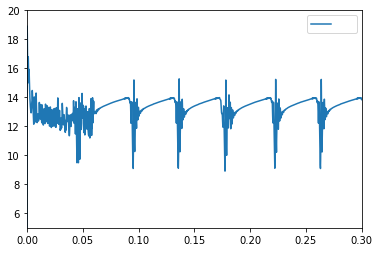

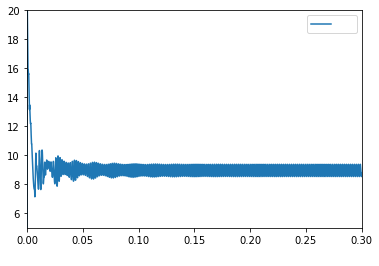

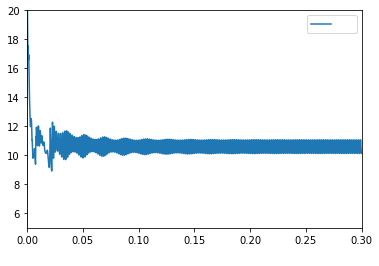

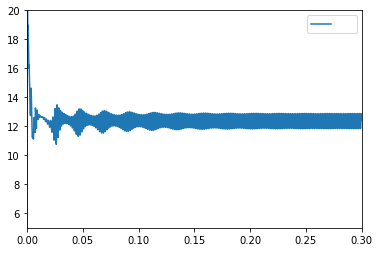

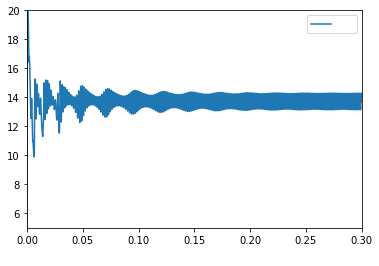

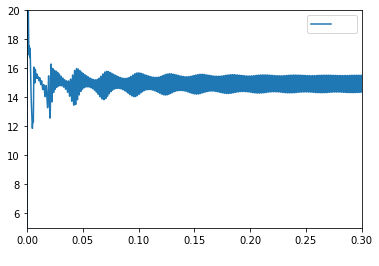

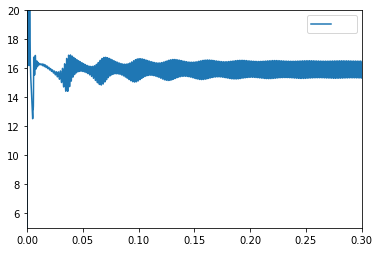

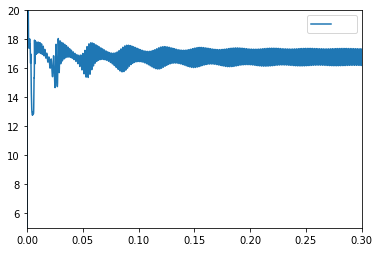

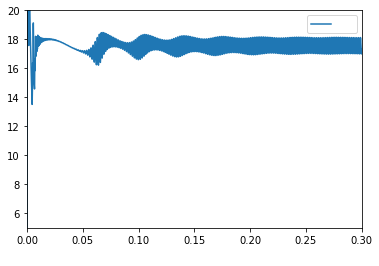

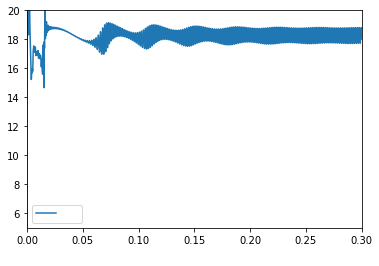

In [38]:
for f_val in sorted(set(inputFrame['f'].values)):
    indexFrame = inputFrame.loc[inputFrame['Ra'] == 10**6.5]
    indexFrame = indexFrame.loc[indexFrame['f'] == f_val]
    indices = indexFrame.index
    localFrame.loc[indices].plot(
        'modeltime',
        'Nu',
#         xlim = (0.25, 0.3),
        ylim = (5., 20.),
        )

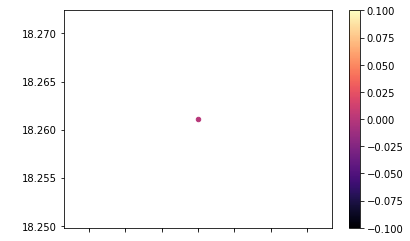

In [40]:
subFrame = superFrame.loc[indices]
subFrame.plot.scatter(
    'f',
    'Nu_tAv',
    c = mpl.colors.Normalize()(subFrame['Ra'].values),
    cmap = 'magma',
    )

In [ ]:
index = inputFrame.loc[inputFrame['Ra'] == 10**6.5].index